# Description

This project aims to utilize Generative Adversarial Networks (GANs), specifically a CycleGAN, to transform regular photographs into images that imitate the style of Claude Monet's paintings. The CycleGAN will be trained to convert images from the domain of photographs to the domain of Monet's artwork without requiring matched pairs of photos and paintings.

In [26]:
import numpy as np
import os
import pandas as pd 
from PIL import Image
import matplotlib.pyplot as plt
import random
import tensorflow as tf
import math
from tensorflow.keras import layers
import tensorflow.keras as keras
import matplotlib.pyplot as plt

In [42]:
monet_images = []
photo_images = []

monet_images_dir = '/kaggle/input/gan-getting-started/monet_jpg'
photo_images_dir = '/kaggle/input/gan-getting-started/photo_jpg'


for img in os.listdir(monet_images_dir)[:5]:
    monet_images.append(Image.open(os.path.join(monet_images_dir, img)))

for img in os.listdir(photo_images_dir)[:5]:
    photo_images.append(Image.open(os.path.join(photo_images_dir, img)))
    
monet_tfrec_list = tf.io.gfile.glob(str('/kaggle/input/gan-getting-started/monet_tfrec/*.tfrec'))
photo_tfrec_list = tf.io.gfile.glob(str('/kaggle/input/gan-getting-started/photo_tfrec/*.tfrec'))


In [43]:
monet_count = len(os.listdir('/kaggle/input/gan-getting-started/monet_jpg'))
photo_count = len(os.listdir('/kaggle/input/gan-getting-started/photo_jpg'))
print(f'Total number of monet images (jpgs) is: {monet_count}')
print(f'Total number of monet images (jpgs) is: {photo_count}')

print('Monet TFRec Files:', len(monet_tfrec_list))
print('Photo TFRec Files:', len(photo_tfrec_list))

Total number of monet images (jpgs) is: 300
Total number of monet images (jpgs) is: 7038
Monet TFRec Files: 5
Photo TFRec Files: 20


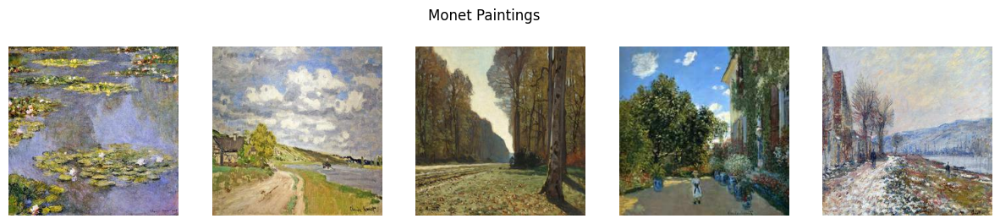

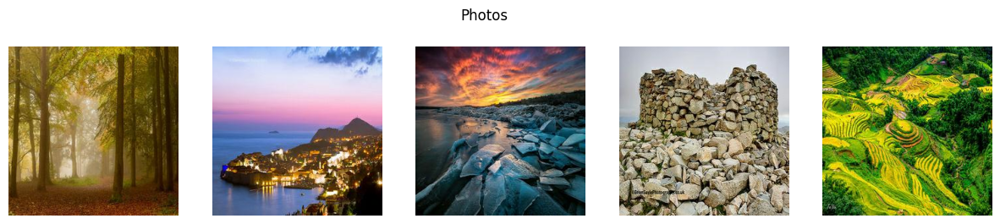

In [29]:
# Function to display a list of images
def display_images(images, title):
    plt.figure(figsize=(15, 3))
    for i, image in enumerate(images):
        plt.subplot(1, len(images), i + 1)
        plt.imshow(image)
        plt.axis('off')
    plt.suptitle(title)
    plt.show()

# Display Monet images
display_images(monet_images, "Monet Paintings")

# Display photo images
display_images(photo_images, "Photos")

In [30]:
def plot_rgb_histograms(image, ax, title):
    image_np = np.array(image)
    colors = ('r', 'g', 'b')
    for i, color in enumerate(colors):
        hist = np.histogram(image_np[:, :, i], bins=256, range=(0, 256))[0]
        ax.plot(hist, color=color)
    ax.set_title(title)
    ax.set_xlim(0, 256)

# Display 5 random images with RGB histograms
def display_random_images_with_histograms(images, num_images=5):
    random_images = random.sample(images, num_images)
    fig, axs = plt.subplots(num_images, 2, figsize=(15, 5 * num_images))
    
    for i, image in enumerate(random_images):
        # Plot image
        axs[i, 0].imshow(image)
        axs[i, 0].axis('off')
        axs[i, 0].set_title(f'Image {i + 1}')
        
        # Plot RGB histograms
        plot_rgb_histograms(image, axs[i, 1], f'RGB Histograms {i + 1}')
    
    plt.tight_layout()
    plt.show()

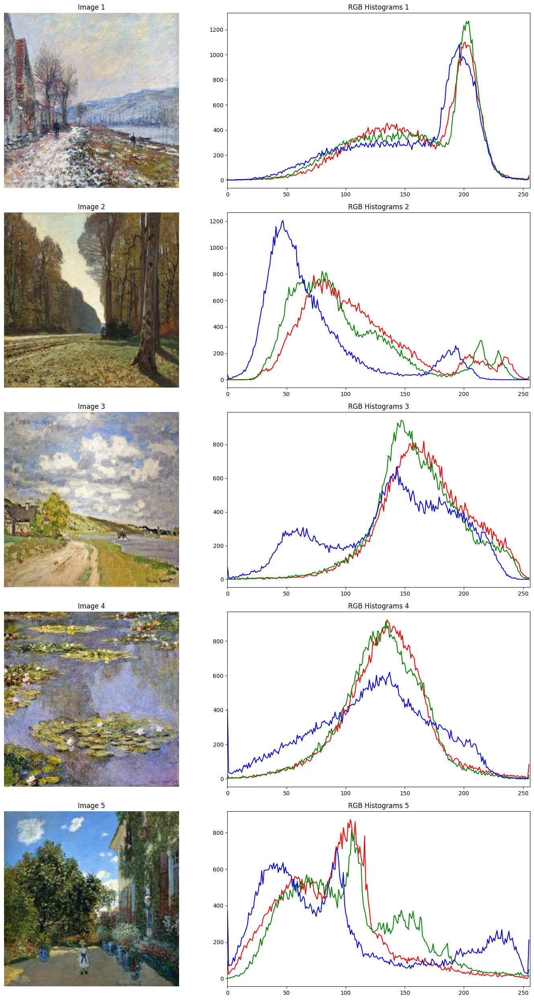

In [36]:
display_random_images_with_histograms(monet_images)

We need to create functions to extract image data from the TFRecord files. The images are pre-formatted to a 256x256 resolution and use the standard RGB color model with 3 channels.
In our GAN implementation, we'll be using the tanh activation function in the generator. This function outputs values in a specific range. To ensure our input data aligns with this output range, we need to rescale the image pixel values to fall between -1 and 1.
The functions we'll define will handle these tasks: reading the TFRecord files, decoding the image data, and rescaling the pixel values appropriately.

In [44]:
IMAGE_SIZE = [256, 256]

def decode_image(image):
    # This method decodes image to a uint8 tensor
    image = tf.image.decode_jpeg(image, channels=3)
    # Here is where we normalize to [-1 1] by dividing by 128 (be careful to cast to float!) and subtracting 1
    image = (tf.cast(image, tf.float32) / 128) - 1
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

def read_tfrecord(example):
    # Configure the tfrecord format
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    # Parse the record
    example = tf.io.parse_single_example(example, tfrecord_format)
    # Forget everything except that actual image
    image = decode_image(example['image'])
    return image

# Now this is the top-level data loading function
def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord)
    return dataset

Using the Downsample function in a CycleGAN model is a common approach to reduce the spatial dimensions of images while preserving essential features. This is typically done in the discriminator network or the encoder part of the generator to capture high-level features at different scales, which is crucial for tasks like image translation in CycleGANs.

An Upsample function is typically used to increase the spatial dimensions of feature maps, essentially reversing the effect of the Downsample operation. The goal is to restore the resolution of the image while maintaining the learned features from previous layers.

In [46]:
def Downsample(filters, size, apply_instancenorm=True):
    # Create sequential model
    result = keras.Sequential()
    
    result.add(layers.Conv2D(filters, size, strides=2, padding='same', kernel_initializer=keras.initializers.HeNormal(), use_bias=False))
    
    if apply_instancenorm:
        result.add(tf.keras.layers.GroupNormalization(groups=-1, gamma_initializer=keras.initializers.RandomNormal()))

    result.add(layers.LeakyReLU())

    return result

def Upsample(filters, size, apply_dropout=False):
    result = keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2, padding='same', kernel_initializer=keras.initializers.HeNormal(), use_bias=False))

    result.add(tf.keras.layers.GroupNormalization(groups=-1, gamma_initializer=keras.initializers.RandomNormal()))

    if apply_dropout:
        result.add(layers.Dropout(0.5))

    result.add(layers.ReLU())

    return result

The generator is a neural network that learns to transform images from one domain to another. In CycleGAN, there are typically two generators: Transforms images from domain X (e.g., horses) to domain Y (e.g., zebras) and vice-versa.

#### Function of the Generator:
* Image Transformation: The primary goal is to generate images that look like they belong to the target domain. For example,  G takes an image of a horse and generates an image that looks like a zebra.
* Cycle Consistency: CycleGAN, the generators must also ensure that when an image is transformed from one domain to another and back again (e.g. X → Y → X), it closely resembles the original image. 

In [47]:
def Generator():
    inputs = layers.Input(shape=(256,256,3))

    max_iters = int(math.log2((256, 256, 3)[0]))

    down_stack = []
    for i in range(max_iters):
        iter_norm = False if i == 0 else True
        down_stack.append(Downsample(64, 4, apply_instancenorm=iter_norm))

    up_stack = []
    for i in range(max_iters - 1):
        iter_dropout = True if i < 3 else False
        up_stack.append(Upsample(64, 4, apply_dropout=iter_dropout))

    last = layers.Conv2DTranspose(3, 4, strides=2, padding='same', kernel_initializer=keras.initializers.RandomNormal(), activation='tanh')

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

The discriminator is a neural network that attempts to distinguish between real images from a domain and the fake images generated by the generator.

#### Function of the Discriminator:
* Real vs. Fake Classification: The discriminator's job is to classify whether an image is a real image from the target domain or a fake image generated by the generator. For instance, D tries to classify whether an image is a real zebra or a horse that was transformed into a zebra by G.

* Adversarial Loss: The discriminator provides feedback to the generator through the adversarial loss. The generator tries to minimize this loss, meaning it aims to fool the discriminator into thinking the generated images are real. Conversely, the discriminator tries to maximize this loss, improving its ability to distinguish between real and fake images.

In [50]:
def Discriminator():

    inp = layers.Input(shape=(256,256,3), name='input_image')

    x = inp

    down1 = Downsample(64, 3, False)(x)
    down2 = Downsample(64, 3)(down1)
    down3 = Downsample(64, 3)(down2)

    zero_pad1 = layers.ZeroPadding2D()(down3)
    conv = layers.Conv2D(64, 3, strides=1, kernel_initializer=keras.initializers.HeNormal(), use_bias=False)(zero_pad1)

    norm1 = tf.keras.layers.GroupNormalization(groups=-1, gamma_initializer=keras.initializers.RandomNormal())(conv)

    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu)

    last = layers.Conv2D(1, 3, strides=1, kernel_initializer=keras.initializers.HeNormal())(zero_pad2)

    return tf.keras.Model(inputs=inp, outputs=last)

In [51]:
# Generators and Discriminators for both photos and monets

monet_generator = Generator() 
photo_generator = Generator() 
monet_discriminator = Discriminator() 
photo_discriminator = Discriminator() 

The CycleGan class defines a CycleGAN model for image-to-image translation, involving two generators (one for translating photos to Monet-style images and another for the reverse) and two discriminators (one for each domain). The __init__ method initializes these components along with a cycle consistency weight. The compile method sets up the optimizers and loss functions needed for training. The train_step method handles a single training iteration by translating images, computing losses (including generator loss, cycle consistency loss, and identity loss), and applying gradients to update the model parameters using the optimizers. This structure enables the model to learn effective translations between domains while ensuring the transformations are consistent and reversible

In [55]:
class CycleGan(keras.Model):
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.gen_m = monet_generator
        self.gen_p = photo_generator
        self.disc_m = monet_discriminator
        self.disc_p = photo_discriminator
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        gen_m_optimizer,
        gen_p_optimizer,
        disc_m_optimizer,
        disc_p_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.gen_m_optimizer = gen_m_optimizer
        self.gen_p_optimizer = gen_p_optimizer
        self.disc_m_optimizer = disc_m_optimizer
        self.disc_p_optimizer = disc_p_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def photo_conversions(self, real_monet, real_photo):
        fake_monet = self.gen_m(real_photo, training=True)
        cycled_photo = self.gen_p(fake_monet, training=True)

        fake_photo = self.gen_p(real_monet, training=True)
        cycled_monet = self.gen_m(fake_photo, training=True)

        same_monet = self.gen_m(real_monet, training=True)
        same_photo = self.gen_p(real_photo, training=True)
        
        return (fake_monet, fake_photo, cycled_monet, cycled_photo, same_monet, same_photo)
    
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            fake_monet, fake_photo, cycled_monet, cycled_photo, same_monet, same_photo = self.photo_conversions(real_monet, real_photo)

            # discriminator used to check, inputing real images
            disc_real_monet = self.disc_m(real_monet, training=True)
            disc_real_photo = self.disc_p(real_photo, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_monet = self.disc_m(fake_monet, training=True)
            disc_fake_photo = self.disc_p(fake_photo, training=True)

            # evaluates generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            # evaluates total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            # evaluates discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.gen_m.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.gen_p.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.disc_m.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.disc_p.trainable_variables)

        # Apply the gradients to the optimizer
        self.gen_m_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.gen_m.trainable_variables))

        self.gen_p_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.gen_p.trainable_variables))

        self.disc_m_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.disc_m.trainable_variables))

        self.disc_p_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.disc_p.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

In [67]:
def discriminator_loss(real, generated):
    real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)
    generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5

def generator_loss(generated):
    return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

def cycle_loss(real_image, cycled_image, lam):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return lam * loss1

def identity_loss(real_image, same_image, lam):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return lam * 0.5 * loss

In [68]:
monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [69]:
cycle_gan = CycleGan(monet_generator, photo_generator, monet_discriminator, photo_discriminator)

cycle_gan.compile(
    gen_m_optimizer = monet_generator_optimizer,
    gen_p_optimizer = photo_generator_optimizer,
    disc_m_optimizer = monet_discriminator_optimizer,
    disc_p_optimizer = photo_discriminator_optimizer,
    gen_loss_fn = generator_loss,
    disc_loss_fn = discriminator_loss,
    cycle_loss_fn = cycle_loss,
    identity_loss_fn = identity_loss
)

In [70]:
monet_dataset = load_dataset(monet_tfrec_list, labeled=True).batch(1)
photo_dataset = load_dataset(photo_tfrec_list, labeled=True).batch(1)

dataset = tf.data.Dataset.zip((monet_dataset, photo_dataset))

cycle_gan.fit(dataset, epochs=50)

Epoch 1/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 151s 42ms/step - monet_disc_loss: 0.6725 - monet_gen_loss: 4.6754 - photo_disc_loss: 0.6788 - photo_gen_loss: 4.7387
Epoch 2/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - monet_disc_loss: 0.6359 - monet_gen_loss: 3.1224 - photo_disc_loss: 0.6665 - photo_gen_loss: 3.1013
Epoch 3/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 13s 42ms/step - monet_disc_loss: 0.6204 - monet_gen_loss: 2.8810 - photo_disc_loss: 0.6485 - photo_gen_loss: 2.8515
Epoch 4/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - monet_disc_loss: 0.6174 - monet_gen_loss: 2.7237 - photo_disc_loss: 0.6370 - photo_gen_loss: 2.6999
Epoch 5/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - monet_disc_loss: 0.6102 - monet_gen_loss: 2.6345 - photo_disc_loss: 0.6296 - photo_gen_loss: 2.6082
Epoch 6/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - monet_disc_loss: 0.6063 - monet_gen_loss: 2.5777 - photo_disc_loss: 0.6251 - photo_gen_loss: 2.5495
Epoch 7/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - monet_d

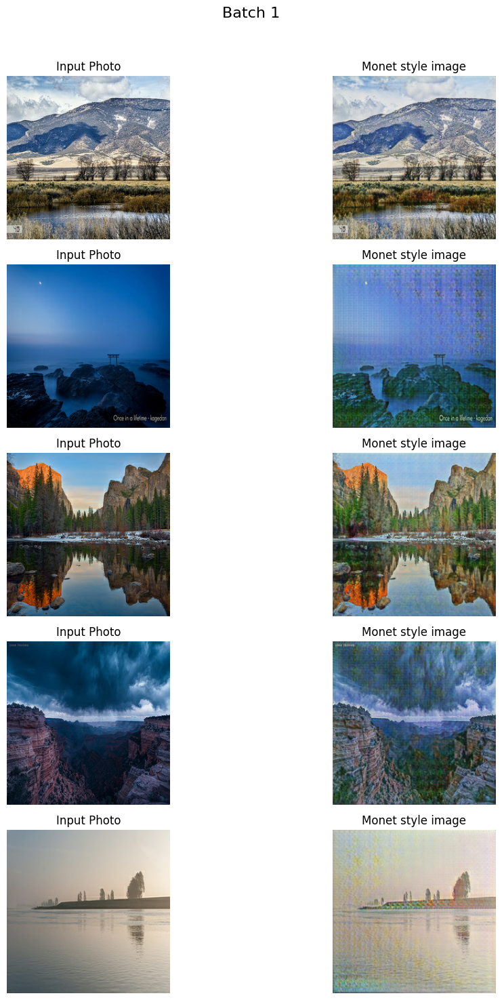

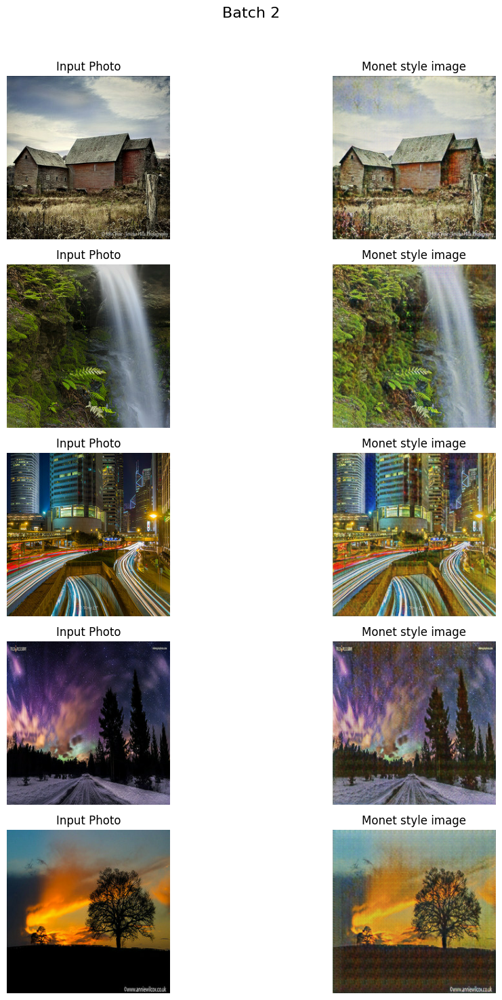

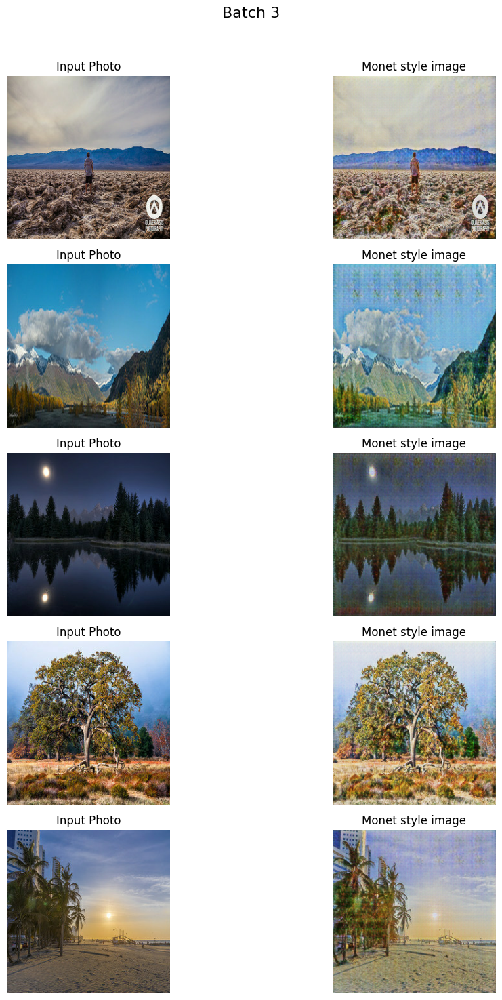

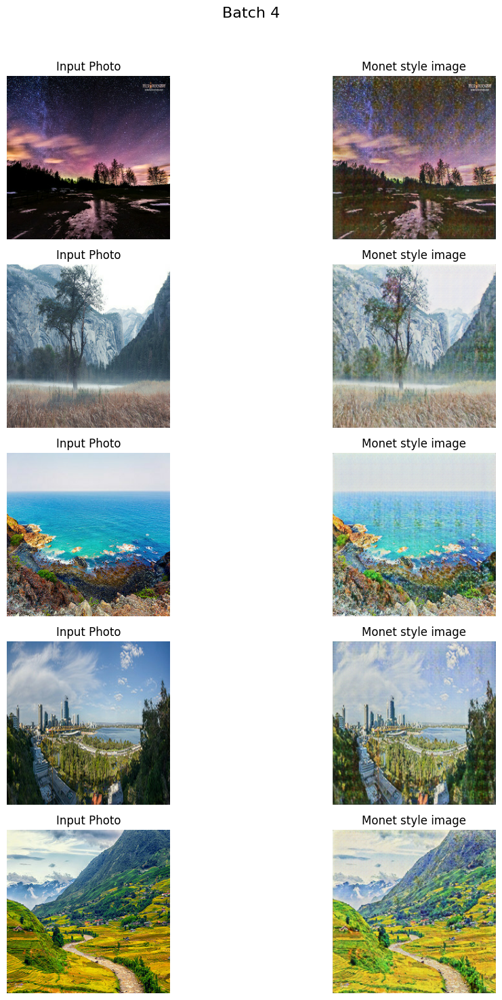

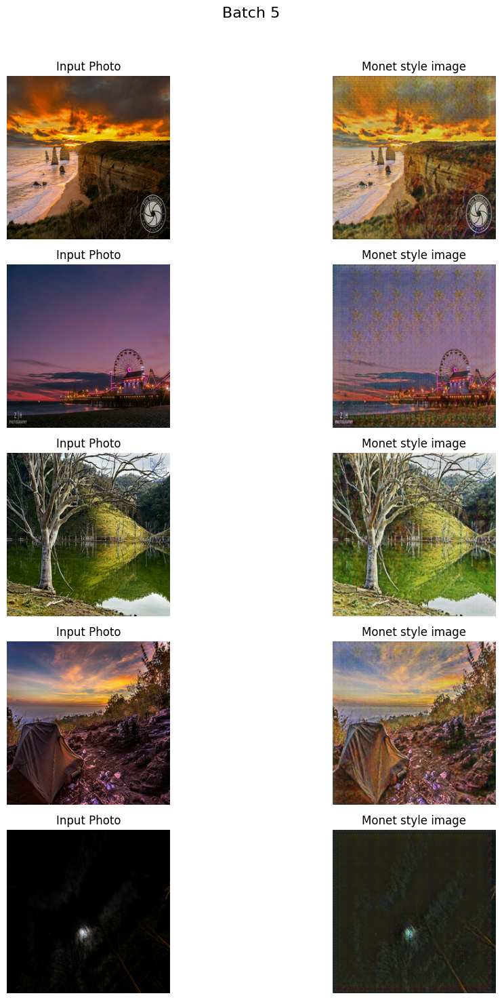

In [79]:
def plot_images(photo_ds, monet_generator, num_batches=5):
    for z in range(num_batches):
        # Create a figure with 5 rows and 2 columns
        fig, axes = plt.subplots(5, 2, figsize=(12, 15))
        fig.suptitle(f'Batch {z + 1}', fontsize=16)
        
        # Iterate over the images in the current batch
        for i, img in enumerate(photo_ds.skip(z * 5).take(5)):
            # Generate the Monet-style image
            prediction = monet_generator(img, training=False)[0].numpy()
            prediction = (prediction * 128 + 128).astype(np.uint8)
            
            # Convert input image to numpy and scale
            img = (img[0] * 128 + 128).numpy().astype(np.uint8)
            
            # Plot input image
            axes[i, 0].imshow(img)
            axes[i, 0].set_title("Input Photo")
            axes[i, 0].axis("off")
            
            # Plot Monet-style image
            axes[i, 1].imshow(prediction)
            axes[i, 1].set_title("Monet style image")
            axes[i, 1].axis("off")
        
        # Adjust layout to prevent overlap
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

# Call the function with your dataset and generator
plot_images(photo_dataset, monet_generator)

In [75]:
import PIL
! mkdir /kaggle/working/images

i = 1
for img in photo_dataset:
    prediction = monet_generator(img, training=False)[0].numpy()
    prediction = (prediction * 128 + 128).astype(np.uint8)
    im = PIL.Image.fromarray(prediction)
    im.save("/kaggle/working/images/" + str(i) + ".jpg")
    i += 1

In [77]:
import shutil
shutil.make_archive("/kaggle/working/images", 'zip', "images")

'/kaggle/working/images.zip'

## Summary

The experiment involves using a CycleGAN model to perform image-to-image translation between two domains (e.g., photos and Monet-style paintings). The model consists of two generators—one for translating images from photos to Monet-style and another for the reverse—and two discriminators for distinguishing real images from generated ones. The CycleGan class handles the initialization of these networks, compiles them with appropriate optimizers and loss functions, and performs training through iterative updates. Key aspects of the training include computing generator losses, cycle consistency losses to ensure reversible transformations, and discriminator losses to refine the ability to distinguish between real and fake images. 

## Future improvements

* Build complex Discriminator and Generator than these ones.
* Adjust Learning Rates: Experiment with learning rate schedules or adaptive learning rate optimizers to improve convergence.
* Fine-tune Hyperparameters: Optimize hyperparameters like the cycle consistency weight (lambda_cycle) and loss function coefficients to balance the different objectives effectively.


## References

Keras CycleGAN: https://keras.io/examples/generative/cyclegan/

Original Paper: https://arxiv.org/pdf/1703.10593